# Création d'un dataset d'ordre de lecture sur PubLayNet

In [1]:
# !pip install Unidecode
# !pip install fuzzysearch

# !pip install elementpath
# !pip install lxml 
# !pip install graphviz
# !pip install pydotplus

In [2]:
!ls ../../../edspdf-train/data/publaynet/

dev.json			test	       train	       xmls
oa_file_list.ARTgjjvC.csv.part	test_urls.txt  train_urls.txt  xmls-bis


In [3]:
import sys
sys.path.append('../')
import os
from pathlib import Path
import json
from sort_xml import *
import numpy as np
import pickle as pk

from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc


base_dir = '../../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

sys.executable

'/export/home/smbaye/edspdf-train/.venv/bin/python'

### Load pdf and xml names and info

In [4]:
xmls_dir = base_dir + 'test/'
dev_path = base_dir + 'dev.json'

with open(Path(dev_path)) as f:
    samples = json.load(f)

# load xml files
xmls_names = {} # {pmc = {xml_fname, pdf_fname}}
for root, directories, files in os.walk(xmls_dir):
    for pmc in directories:
        fdir = xmls_dir + pmc
        for root2, directories2, files2 in os.walk(fdir):
            xml_fname = None
            pdfs_fnames = []
            for file in files2:
                if file.split('.')[-1] == 'nxml':
                    xml_fname = file
                if file.split('.')[-1] == 'pdf':
                    pdfs_fnames.append(file)

            lenghts = [len(pf) for pf in pdfs_fnames]
            # if len(lenghts) == 0:
            #   print(f'fdir ==> {fdir}')

            i_min = np.argmin(lenghts)
            xmls_names[pmc] = {'xml' :xml_fname, 'pdf': pdfs_fnames[i_min], 'page_num': None}
    break
# end load xml files
    
    
for image in samples['images']:
    pmc = image['file_name'].split('_')[0]
    if pmc in xmls_names:
        page_num = int(image['file_name'].split('_')[1].split('.')[0])
        xmls_names[pmc]['page_num'] = page_num


In [5]:
print(f'Nb pmc {len(xmls_names)}')
for k,v in xmls_names.items():
    print(f'k: {k} -> v: {v}')
    break

Nb pmc 200
k: PMC3142684 -> v: {'xml': 'IJMB2011-750613.nxml', 'pdf': 'IJMB2011-750613.pdf', 'page_num': 0}


In [6]:
# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

In [7]:
import subprocess
import re

# Commande à exécuter
command = 'ls ../../../edspdf-train/data/publaynet/test'  # Cette commande liste les fichiers dans le répertoire courant (sur Unix/Linux/Mac)

# Exécution de la commande
process = subprocess.run(command, shell=True, capture_output=True, text=True, encoding='utf-8', errors='ignore')

# Récupération et affichage de la sortie
pmcs = process.stdout
pmcs = re.sub(r'\x1b\[.*?m', '', pmcs).splitlines()

print("Standard Output:")
n1, n2 = 0, 100
print(pmcs[n1:n2])
print(len(pmcs[n1:n2]))

Standard Output:
['PMC3127795', 'PMC3128847', 'PMC3129309', 'PMC3130634', 'PMC3131248', 'PMC3131718', 'PMC3131719', 'PMC3131722', 'PMC3131723', 'PMC3131724', 'PMC3131725', 'PMC3131726', 'PMC3131727', 'PMC3131728', 'PMC3131729', 'PMC3132611', 'PMC3132614', 'PMC3132631', 'PMC3132637', 'PMC3133014', 'PMC3134090', 'PMC3134103', 'PMC3134179', 'PMC3134215', 'PMC3134251', 'PMC3134270', 'PMC3134833', 'PMC3134836', 'PMC3134861', 'PMC3134868', 'PMC3134884', 'PMC3134889', 'PMC3135072', 'PMC3135095', 'PMC3135108', 'PMC3135116', 'PMC3135120', 'PMC3135134', 'PMC3135138', 'PMC3135154', 'PMC3135156', 'PMC3135163', 'PMC3135211', 'PMC3135219', 'PMC3135235', 'PMC3135239', 'PMC3135242', 'PMC3135259', 'PMC3135276', 'PMC3135313', 'PMC3135317', 'PMC3135507', 'PMC3137160', 'PMC3137162', 'PMC3137164', 'PMC3137166', 'PMC3137169', 'PMC3137170', 'PMC3137171', 'PMC3137174', 'PMC3137175', 'PMC3137176', 'PMC3137177', 'PMC3137178', 'PMC3137179', 'PMC3137180', 'PMC3137181', 'PMC3137183', 'PMC3137185', 'PMC3137186', 'P

NOT OK
l_it_pmc = [(23, 'PMC3134215')]

In [8]:
# OK 1-23
# PMC3134215  -->  24/100
for it,pmc in enumerate(pmcs[n1:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3127795  -->  1/100
body nodes 15/15
front nodes 3/4

------------------------
PMC3128847  -->  2/100
body nodes 8/8
front nodes 3/4

------------------------
PMC3129309  -->  3/100
table 0 nodes 9/10
table 1 nodes 6/6
table 2 nodes 5/6
table 3 nodes 5/6
table 4 nodes 5/6
body nodes 24/40
front nodes 6/6

------------------------
PMC3130634  -->  4/100
table 0 nodes 28/28
body nodes 87/94
front nodes 4/6

------------------------
PMC3131248  -->  5/100
table 0 nodes 6/6
table 1 nodes 4/4
table 2 nodes 11/11
body nodes 51/54
front nodes 6/7

------------------------
PMC3131718  -->  6/100
body nodes 32/37
front nodes 5/5

------------------------
PMC3131719  -->  7/100
table 0 nodes 19/21
table 1 nodes 10/10
table 2 nodes 11/11
table 3 nodes 8/8
table 4 nodes 7/7
body nodes 32/35
front nodes 4/5

------------------------
PMC3131722  -->  8/100
body nodes 16/18
front nodes 4/5

------------------------
PMC3131723  -->  9/100
table 0 nodes 16/16
table 1 nodes 

KeyboardInterrupt: 

In [9]:
# OK 25-100
# PMC  -->  25-100/100
for it,pmc in enumerate(pmcs[n1+24:n2]):
    print(f'\n------------------------\n{pmc}  -->  {1+it+24}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3134251  -->  25/100
table 0 nodes 21/21
table 1 nodes 9/16
table 2 nodes 7/14
body nodes 28/29
front nodes 4/5

------------------------
PMC3134270  -->  26/100
table 0 nodes 5/5
table 1 nodes 4/4
table 2 nodes 4/4
table 3 nodes 8/8
body nodes 19/19
front nodes 3/5

------------------------
PMC3134833  -->  27/100
table 0 nodes 5/5
body nodes 19/21
front nodes 4/5

------------------------
PMC3134836  -->  28/100
body nodes 30/31
front nodes 3/5

------------------------
PMC3134861  -->  29/100
table 0 nodes 6/6
table 1 nodes 6/6
body nodes 25/26
front nodes 4/5

------------------------
PMC3134868  -->  30/100
body nodes 28/53
front nodes 4/5

------------------------
PMC3134884  -->  31/100
table 0 nodes 9/10
table 1 nodes 6/6
body nodes 33/33
front nodes 3/5

------------------------
PMC3134889  -->  32/100
body nodes 28/28
front nodes 4/5

------------------------
PMC3135072  -->  33/100
table 0 nodes 8/8
body nodes 36/36
front nodes 3/5

-------------

In [11]:
# PMC3134215  -->  24/100
l_it_pmc = [(23, 'PMC3134215')]
for it,pmc in l_it_pmc:
    print(f'\n------------------------\n{pmc}  -->  {1+it}/{len(pmcs[n1:n2])}')
    pmc_dir = xmls_dir + pmc

    pmc_data, (doc,tree), (front_nodes, body_nodes, table_nodes) = match_pdf_xml_2_json(pmc_dir, model, v=True)

    # save pk
    pk_path = pmc_dir + '/' + 'pmc_data.pkl'
    with open(pk_path, 'wb') as file:
        pk.dump(pmc_data, file)


------------------------
PMC3134215  -->  24/100
table 0 nodes 12/31
table 1 nodes 12/73


KeyboardInterrupt: 

In [12]:
# PMC3134215  -->  24/100
pmc_dir

'../../../edspdf-train/data/publaynet/test/PMC3134215'

xml path: ../../../edspdf-train/data/publaynet/test/PMC3134215/JTRAN2011-626501.nxml
pdf path: ../../../edspdf-train/data/publaynet/test/PMC3134215/JTRAN2011-626501.pdf


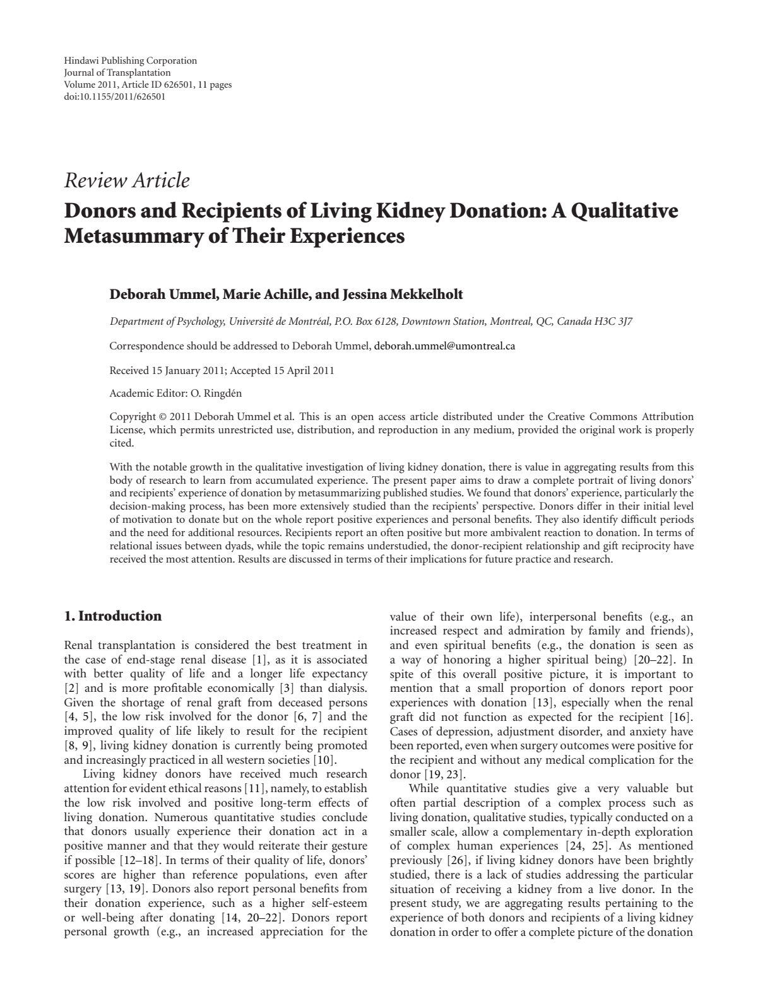

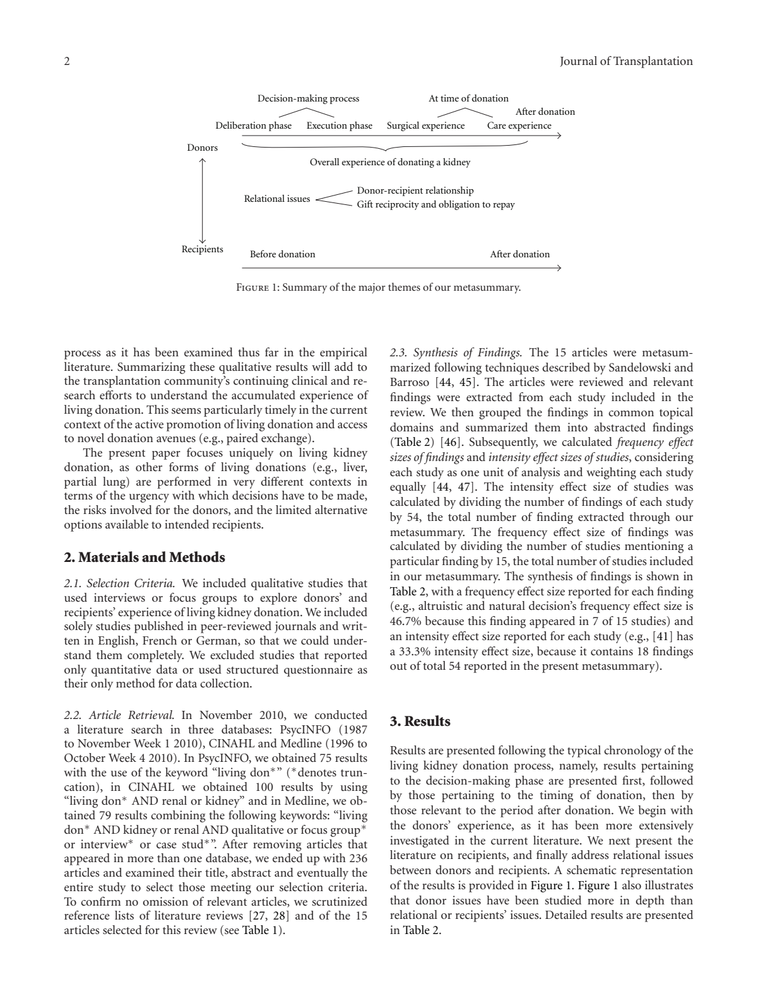

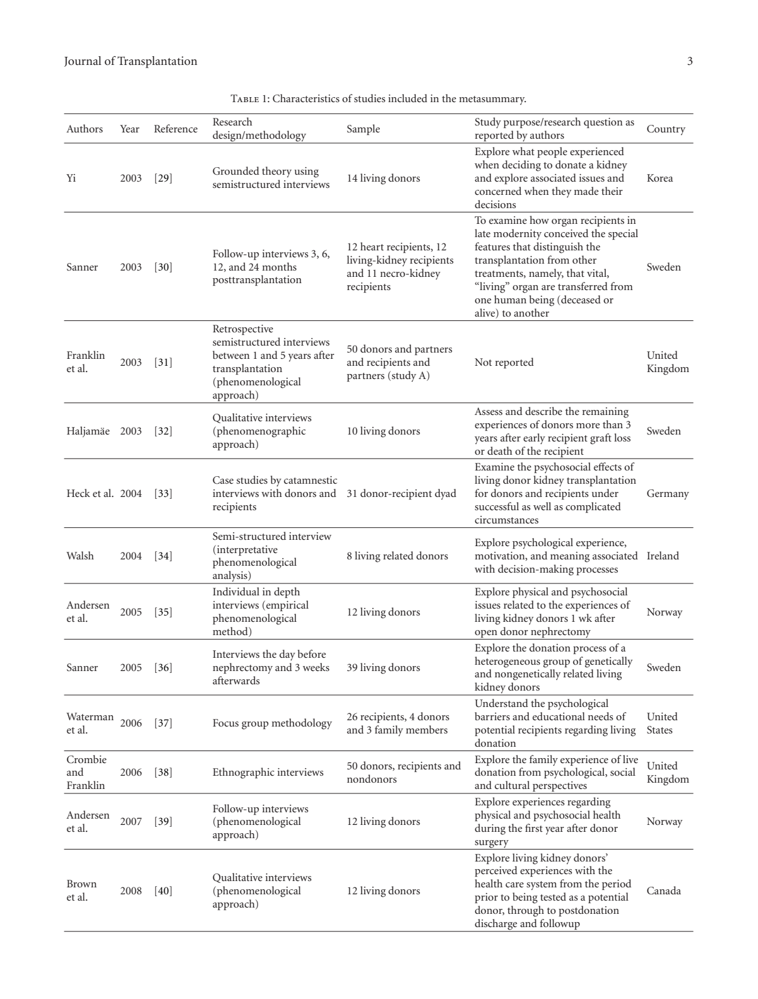

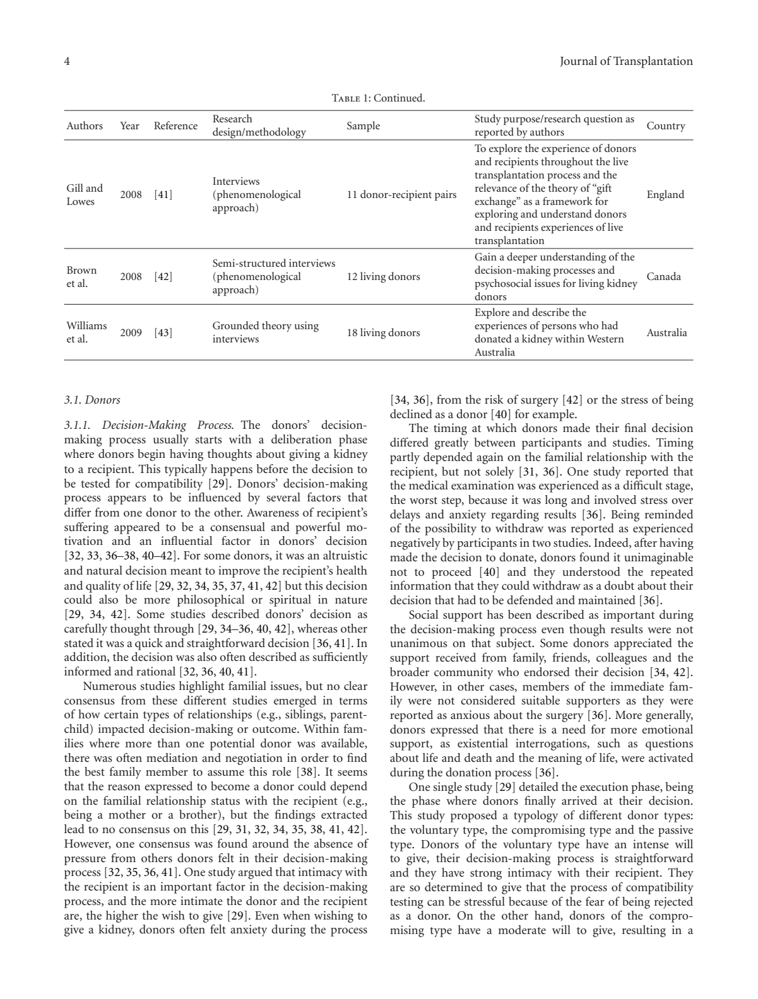

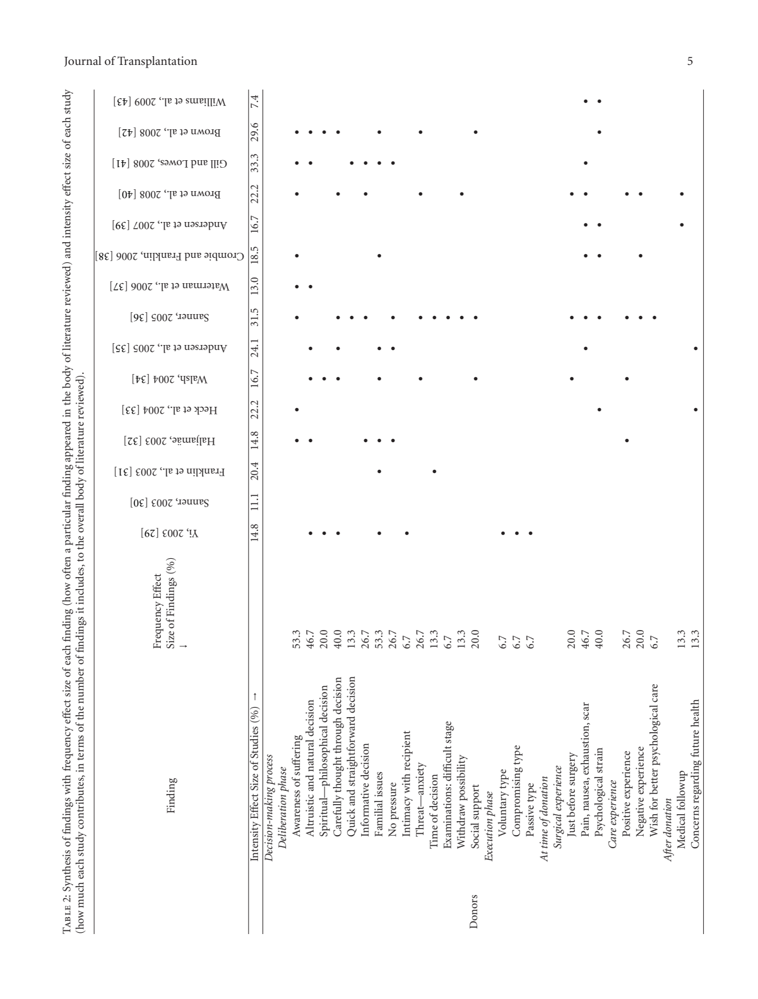

...

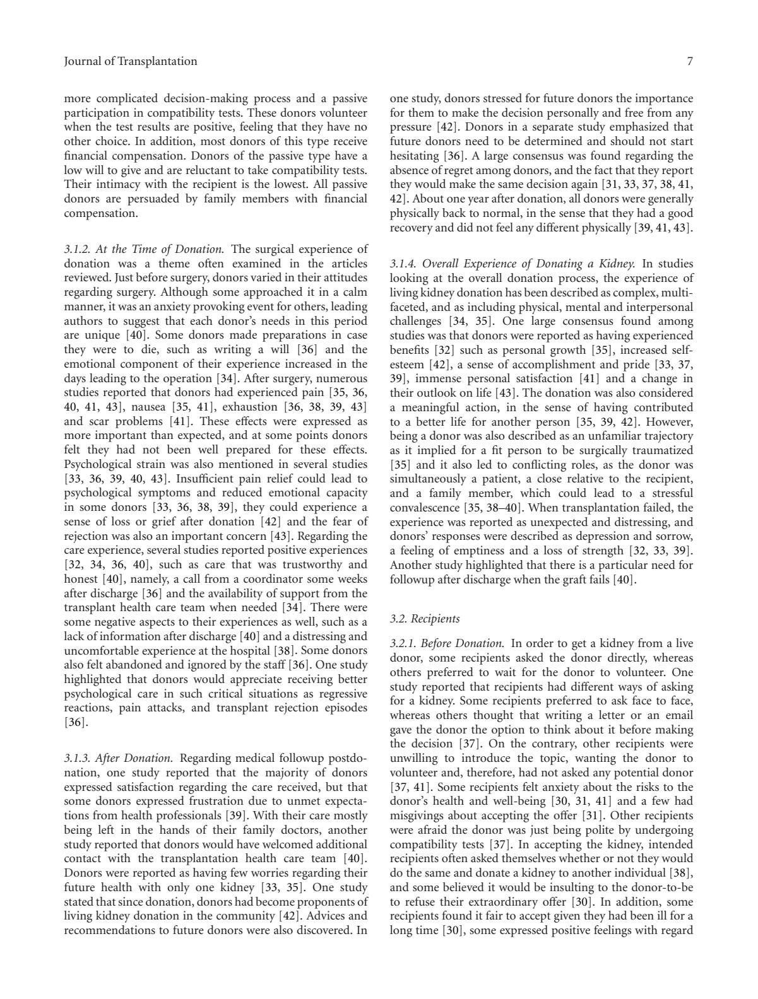

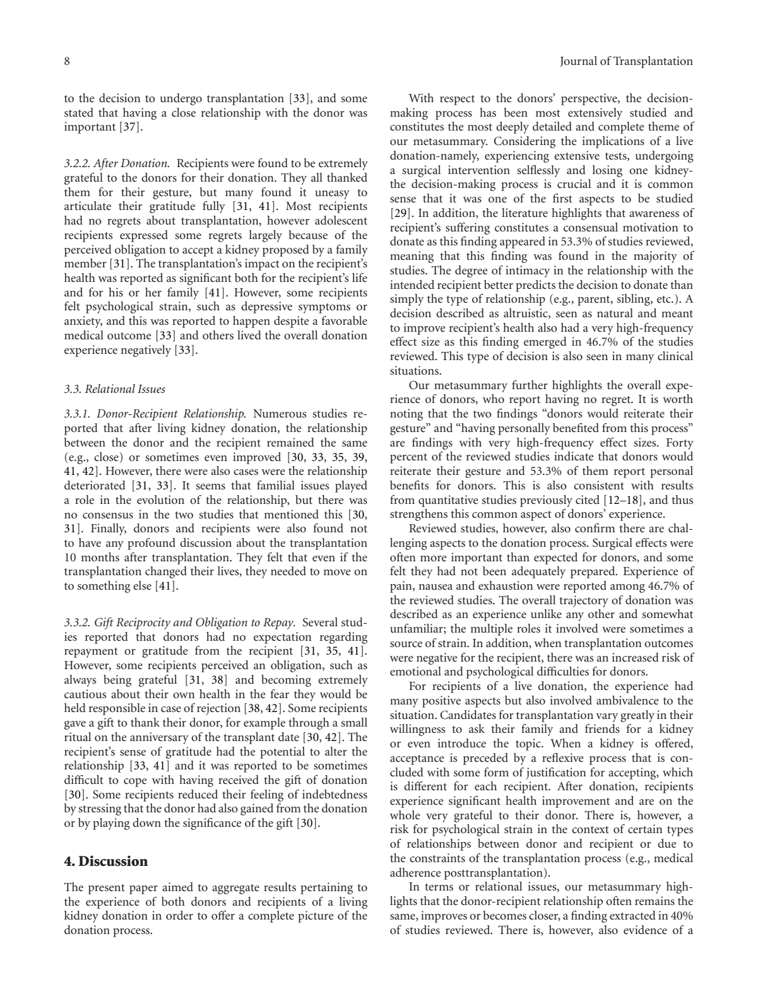

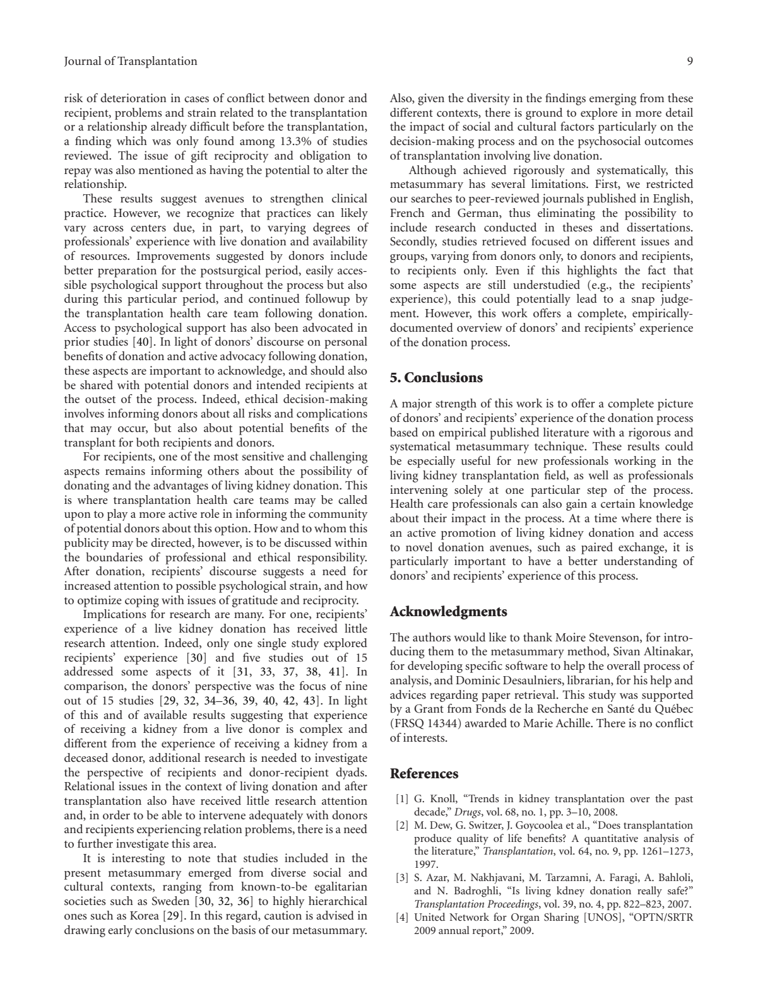

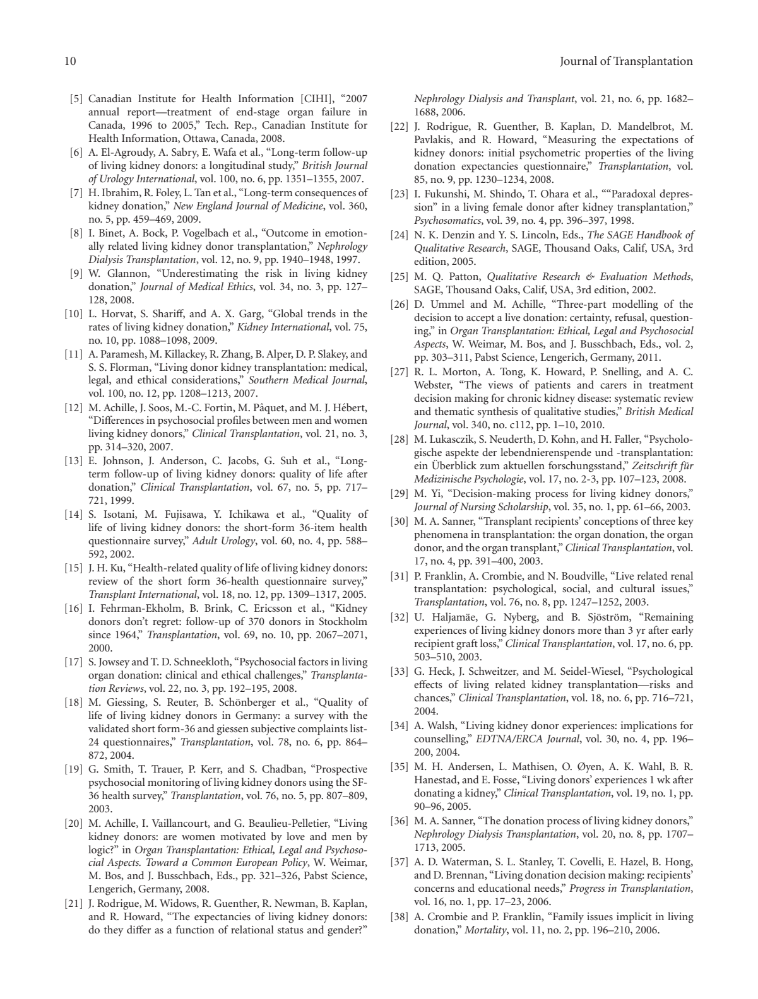

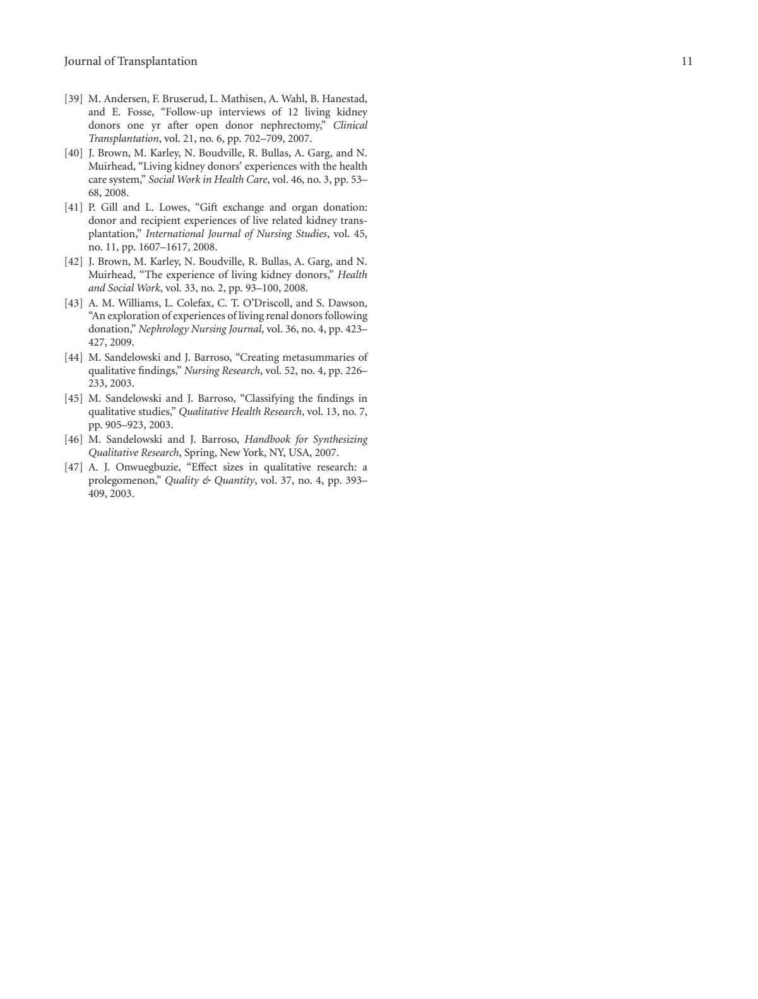

In [13]:
file_dir = '../../../edspdf-train/data/publaynet/test/PMC3134215'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')

pdf = Path(pdf_path).read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

for page in show_annotations(doc.content, []):
    display(page)

In [82]:
with open(pk_path, 'rb') as file:
    loaded_pmc_data = pk.load(file)

## Display pdf(show annotation) with the loaded pkl file

In [4]:
from edspdf.structures import Box, Box_lines, TextBox


pk_path = xmls_dir + 'PMC1087887/pmc_data.pkl'
with open(pk_path, 'rb') as file:
    loaded_pmc_data = pk.load(file)
pdf = Path(loaded_pmc_data['pdf_path']).read_bytes()
doc_2: PDFDoc = model.get_pipe("extractor")(pdf)

content_boxes = []
for li in loaded_pmc_data['front_lines'] + loaded_pmc_data['body_lines'] + loaded_pmc_data['table_lines']:
    _tb = TextBox(
        x0=li['x0'],
        x1=li['x1'],
        y0=li['y0'],
        y1=li['y1'],
        text=li['text'],
        label=li['label'],
        page_num=li['page_num'],
        )
    if li['node_type'] == 'front':
        _tb.rank = f"{li['node_type'][0]}-{li['node_num']}-{li['rank']}"
        _tb.color='yellow'
        _tb.bg_color='black'
    if li['node_type'] == 'body':
        _tb.rank = f"{li['node_type'][0]}-{li['node_num']}-{li['rank']}"
        _tb.color='black'
        _tb.bg_color='cyan'
    if li['node_type'] == 'table':
        _tb.rank = f"{li['node_type'][:2]}-{li['node_num']}-{li['rank']}"
        _tb.color='red'
        _tb.bg_color='white'
    content_boxes.append(_tb)

for page in show_annotations(doc_2.content, content_boxes):
    display(page)

FileNotFoundError: [Errno 2] No such file or directory: '../../../edspdf-train/data/publaynet/test/PMC1087887/pmc_data.pkl'